In [7]:
import os
import PIL
import json
import pickle
import numpy as np
from math import log, exp
from tqdm import tqdm
from random import shuffle
from PIL import Image, ImageEnhance, ImageFont, ImageDraw
from IPython.display import Image, display
from multiprocessing import Pool

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.regularizers import l2
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.python.keras.utils.data_utils import Sequence

tf.keras.backend.clear_session()  # For easy reset of notebook state.

cat_list = ['tops', 'trousers', 'outerwear', 'dresses', 'skirts']

input_shape = (224,224,3)
wt_decay = 5e-4

dims_list = [(7,7),(14,14)]
aspect_ratios = [(1,1), (1,2), (2,1)]

base_folder = '/kaggle'
data_folder = os.path.join( base_folder, 'input', 'til2020' )
train_imgs_folder = os.path.join( data_folder, 'train', 'train' )
train_annotations = os.path.join( data_folder, 'train.json' )
val_imgs_folder = os.path.join( data_folder, 'val', 'val' )
val_annotations = os.path.join( data_folder, 'val.json' )

train_pickle = os.path.join( data_folder, 'train.p', 'train.p' )
val_pickle = os.path.join( data_folder, 'val.p', 'val.p' )

save_model_folder = os.path.join( base_folder, 'working' )
load_model_folder = data_folder

# Precomputed detections json file for tutorial
model_detections = os.path.join(data_folder, 'detections-7x7-14x14-top100.json')

In [ ]:
!pip install /kaggle/input/cvlib-python-package/progressbar-2.5/progressbar-2.5 -f ./ --no-index

!pip install /kaggle/input/cvlib-python-package/imutils-0.5.3/imutils-0.5.3 -f ./ --no-index

!pip install /kaggle/input/cvlib-python-package/cvlib-0.2.3/cvlib-0.2.3 -f ./ --no-index

[[316, 219, 530, 867], [157, 230, 337, 822]] ['person', 'person'] [0.9985798597335815, 0.995378851890564]


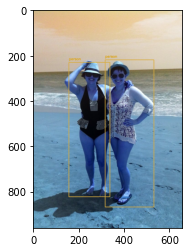

In [3]:
#https://towardsdatascience.com/object-detection-with-less-than-10-lines-of-code-using-python-2d28eebc5b11
import cv2
import matplotlib.pyplot as plt
import cvlib as cv
from cvlib.object_detection import draw_bbox
im = cv2.imread('../input/til2020/train/train/1000.jpg')
bbox, label, conf = cv.detect_common_objects(im)
print(bbox,label,conf)
output_image = draw_bbox(im, bbox, label, conf)
plt.imshow(output_image)
plt.show()

In [76]:
'''
Augmentation methods. We need to implement our own augmentation because native support in keras does not change the bounding box 
labels for us as the image is altered. We need to do it ourselves.
'''
# Helper method: Computes the boundary of the image that includes all bboxes
def compute_reasonable_boundary(labels):
  bounds = [ (x-w/2, x+w/2, y-h/2, y+h/2) for _,x,y,w,h in labels]
  xmin = min([bb[0] for bb in bounds])
  xmax = max([bb[1] for bb in bounds])
  ymin = min([bb[2] for bb in bounds])
  ymax = max([bb[3] for bb in bounds])
  return xmin, xmax, ymin, ymax

def aug_horizontal_flip(img, labels):
  flipped_labels = []
  for c,x,y,w,h in labels:
    flipped_labels.append( (c,1-x,y,w,h) )
  return img.transpose(PIL.Image.FLIP_LEFT_RIGHT), np.array(flipped_labels)

def aug_crop(img, labels):
  # Compute bounds such that no boxes are cut out
  xmin, xmax, ymin, ymax = compute_reasonable_boundary(labels)
  # Choose crop_xmin from [0, xmin]
  crop_xmin = max( np.random.uniform() * xmin, 0 )
  # Choose crop_xmax from [xmax, 1]
  crop_xmax = min( xmax + (np.random.uniform() * (1-xmax)), 1 )
  # Choose crop_ymin from [0, ymin]
  crop_ymin = max( np.random.uniform() * ymin, 0 )
  # Choose crop_ymax from [ymax, 1]
  crop_ymax = min( ymax + (np.random.uniform() * (1-ymax)), 1 )
  # Compute the "new" width and height of the cropped image
  crop_w = crop_xmax - crop_xmin
  crop_h = crop_ymax - crop_ymin
  cropped_labels = []
  for c,x,y,w,h in labels:
    c_x = (x - crop_xmin) / crop_w
    c_y = (y - crop_ymin) / crop_h
    c_w = w / crop_w
    c_h = h / crop_h
    cropped_labels.append( (c,c_x,c_y,c_w,c_h) )

  W,H = img.size
  # Compute the pixel coordinates and perform the crop
  impix_xmin = int(W * crop_xmin)
  impix_xmax = int(W * crop_xmax)
  impix_ymin = int(H * crop_ymin)
  impix_ymax = int(H * crop_ymax)
  return img.crop( (impix_xmin, impix_ymin, impix_xmax, impix_ymax) ), np.array( cropped_labels )

def aug_translate(img, labels):
  # Compute bounds such that no boxes are cut out
  xmin, xmax, ymin, ymax = compute_reasonable_boundary(labels)
  trans_range_x = [-xmin, 1 - xmax]
  tx = trans_range_x[0] + (np.random.uniform() * (trans_range_x[1] - trans_range_x[0]))
  trans_range_y = [-ymin, 1 - ymax]
  ty = trans_range_y[0] + (np.random.uniform() * (trans_range_y[1] - trans_range_y[0]))

  trans_labels = []
  for c,x,y,w,h in labels:
    trans_labels.append( (c,x+tx,y+ty,w,h) )

  W,H = img.size
  tx_pix = int(W * tx)
  ty_pix = int(H * ty)
  return img.rotate(0, translate=(tx_pix, ty_pix)), np.array( trans_labels )

def aug_colorbalance(img, labels, color_factors=[0.2,2.0]):
  factor = color_factors[0] + np.random.uniform() * (color_factors[1] - color_factors[0])
  enhancer = ImageEnhance.Color(img)
  return enhancer.enhance(factor), labels

def aug_contrast(img, labels, contrast_factors=[0.2,2.0]):
  factor = contrast_factors[0] + np.random.uniform() * (contrast_factors[1] - contrast_factors[0])
  enhancer = ImageEnhance.Contrast(img)
  return enhancer.enhance(factor), labels

def aug_brightness(img, labels, brightness_factors=[0.2,2.0]):
  factor = brightness_factors[0] + np.random.uniform() * (brightness_factors[1] - brightness_factors[0])
  enhancer = ImageEnhance.Brightness(img)
  return enhancer.enhance(factor), labels

def aug_sharpness(img, labels, sharpness_factors=[0.2,10.0]):
  factor = sharpness_factors[0] + np.random.uniform() * (sharpness_factors[1] - sharpness_factors[0])
  enhancer = ImageEnhance.Sharpness(img)
  return enhancer.enhance(factor), labels

# Performs no augmentations and returns the original image and bbox. Used for the validation images.
def aug_identity(pil_img, label_arr):
  return np.array(pil_img), label_arr

# This is the default augmentation scheme that we will use for each training image.
def aug_default(img, labels, p={'flip':0.5, 'crop':0.5, 'translate':0.5, 'color':0.2, 'contrast':0.2, 'brightness':0.2, 'sharpness':0.2}):
  if p['color'] > np.random.uniform():
    img, labels = aug_colorbalance(img, labels)
  if p['contrast'] > np.random.uniform():
    img, labels = aug_contrast(img, labels)
  if p['brightness'] > np.random.uniform():
    img, labels = aug_brightness(img, labels)
  if p['sharpness'] > np.random.uniform():
    img, labels = aug_sharpness(img, labels)
  
  if p['flip'] > np.random.uniform():
    img, labels = aug_horizontal_flip(img, labels)
  if p['crop'] > np.random.uniform():
    img, labels = aug_crop(img, labels)
  if p['translate'] > np.random.uniform():
    img, labels = aug_translate(img, labels)
  return np.array(img), labels

def aug_isolate(img, labels, add_bbox=True):
    new_img = PIL.Image.new("RGB", img.size)
    bboxs, cvlabels, confs = cv.detect_common_objects(np.array(img))
    
    for bbox, label, conf in zip(bboxs,cvlabels,confs):
        if label != 'person':
            continue
        cropped_img = img.crop(bbox)
        new_img.paste(cropped_img, bbox[:2])
    
    W,H = img.size
    for c,x,y,w,h in labels:
        impix_xmin = int(W * (x-w/2))
        impix_xmax = int(W * (x+w/2))
        impix_ymin = int(H * (y-h/2))
        impix_ymax = int(H * (y+h/2))
        cropped_img = img.crop( (impix_xmin, impix_ymin, impix_xmax, impix_ymax) )
        if add_bbox: new_img.paste(cropped_img, (impix_xmin, impix_ymin))
    return new_img

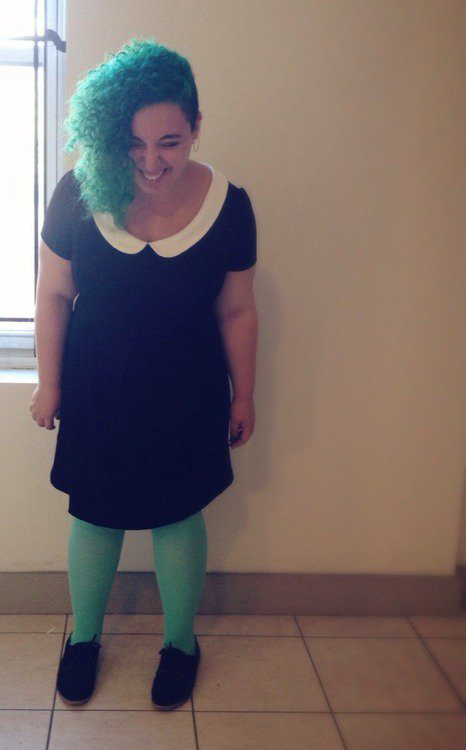

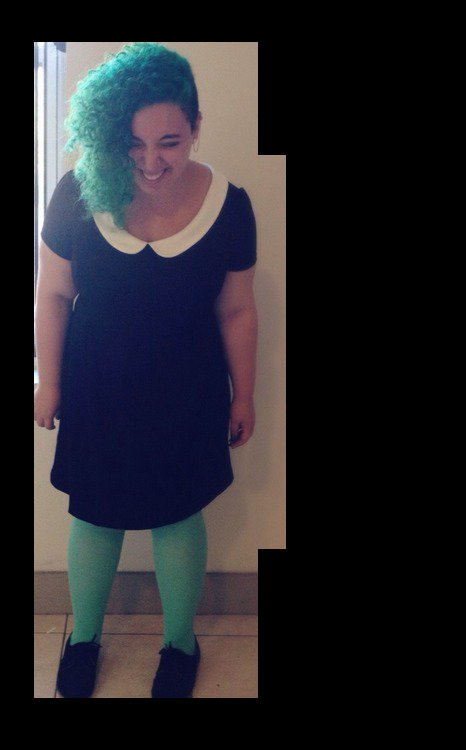

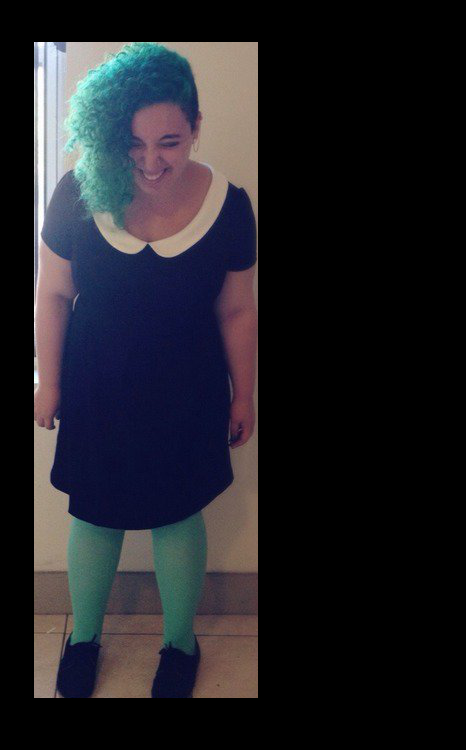

In [77]:
img_id, img_name = random.choice(list(imgs_dict.items()))
labels = data_dict[img_id]
img_fp = os.path.join(train_imgs_folder, img_name)
img = PIL.Image.open(img_fp)
new_img1 = aug_isolate(img, labels, True)
new_img2 = aug_isolate(img, labels, False)
display(img)
display(new_img1)
display(new_img2)

/opt/conda/lib/python3.7/site-packages/PIL/Image.py:2600: DecompressionBombWarning: Image size (123871510 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning)


5827 [[245, 309, 1625, 2611], [1536, 1069, 1936, 2403]] ['person', 'couch'] [0.999617338180542, 0.5441785454750061]


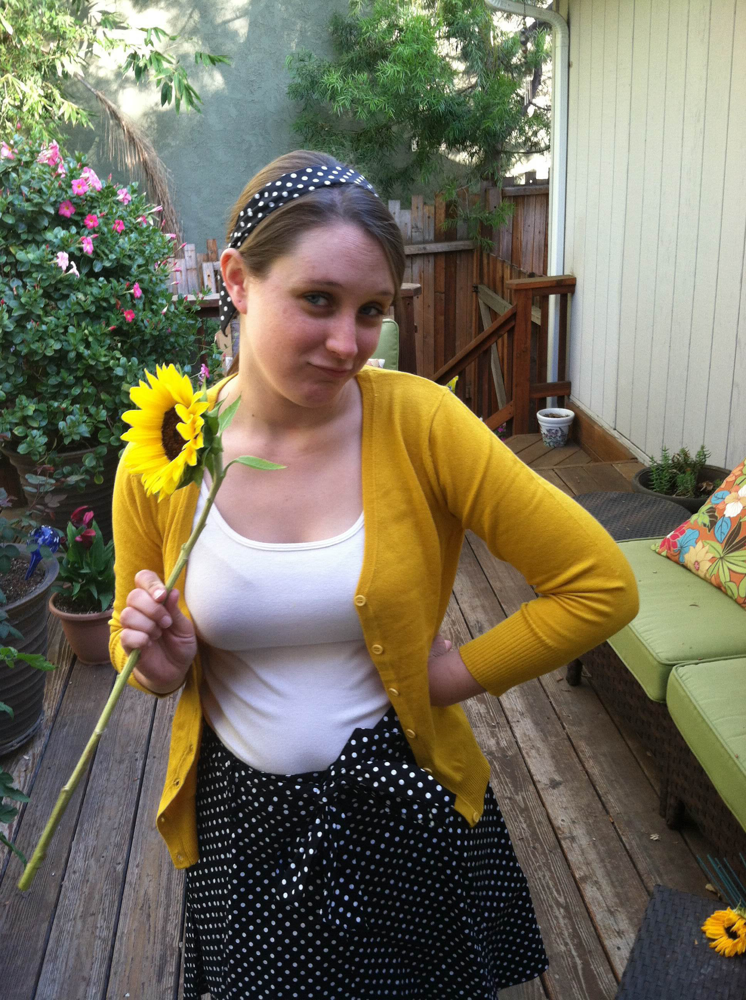

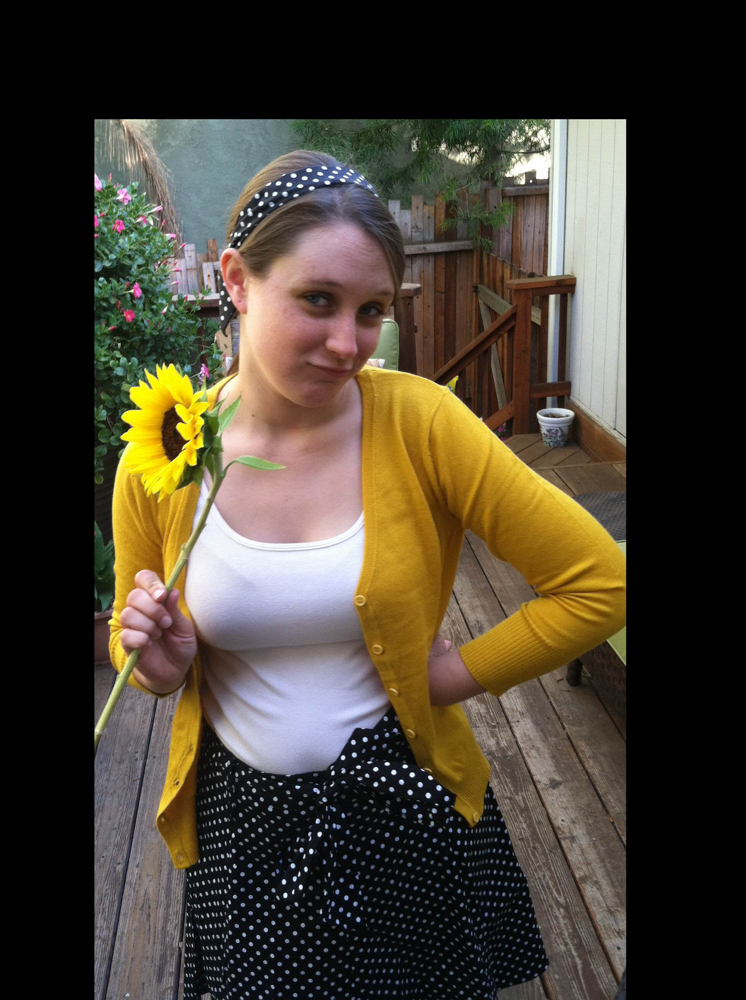

In [73]:


img = load_img("../input/til2020/train/train/1000.jpg")
#display(img)
#display(aug_isolate(img))

import random
with open(train_annotations, 'r') as f:
    annotations_dict = json.load(f)
annotations_list = annotations_dict['annotations']

imgs_dict = {im.split('.')[0]:im for im in os.listdir(train_imgs_folder) if im.endswith('.jpg')}
data_dict = {}
with open(train_annotations, 'r') as f:
  annotations_dict = json.load(f)
annotations_list = annotations_dict['annotations']
for annotation in annotations_list:
  img_id = str(annotation['image_id'])
  c = annotation['category_id'] - 1 # TODO: make sure that category ids start from 1, not 0
  boxleft,boxtop,boxwidth,boxheight = annotation['bbox']
  if img_id in imgs_dict:
    img_fp = os.path.join(train_imgs_folder, imgs_dict[img_id])
    imwidth,imheight = PIL.Image.open(img_fp).size
    if img_id not in data_dict:
      data_dict[img_id] = []
    box_cenx = boxleft + boxwidth/2.
    box_ceny = boxtop + boxheight/2.
    x,y,w,h = box_cenx/imwidth, box_ceny/imheight, boxwidth/imwidth, boxheight/imheight

    data_dict[img_id].append( [c,x,y,w,h] )

img_id, img_name = random.choice(list(imgs_dict.items()))
labels = data_dict[img_id]

#counter += 1
#if counter > 3:
    #break
img_fp = os.path.join(train_imgs_folder, img_name)
img = PIL.Image.open(img_fp)
new_img = aug_isolate(img, labels)
bboxs, cvlabels, confs = cv.detect_common_objects(np.array(img))
print(img_id, bboxs, cvlabels, confs)
display(img)
display(new_img)
# new_img_fp = os.path.join(base_folder, 'working', 'train_isolate', img_name)
# print(img_name)
# new_img.save("kaggle/working/1.jpg")

# bboxs, labels, confs = cv.detect_common_objects(np.array(img))
# brk = False
# for label in labels:
#     if label != 'person':
#         brk = True
#         break
# if brk:
#     print(bboxs,labels,confs)
#     output_image = draw_bbox(np.array(img), bboxs, labels, confs)
#     plt.imshow(output_image)
#     plt.show()
#     display(aug_isolate(img))
#     break

#print(imgs_dict)


In [75]:
for img_id, img_name in imgs_dict.items():
    img_fp = os.path.join(train_imgs_folder, img_name)
    img = PIL.Image.open(img_fp)
    bboxs, cvlabels, confs = cv.detect_common_objects(np.array(img))
    print(img_name)
    if 'person' not in cvlabels:
        print("ERROR: " + img_id)
        break

11479.jpg
5421.jpg
18677.jpg
11036.jpg
9472.jpg
9699.jpg
10528.jpg
7445.jpg
12558.jpg
15768.jpg
11354.jpg
18675.jpg
795.jpg
84.jpg
2520.jpg
3469.jpg
10547.jpg
3879.jpg
16571.jpg
18778.jpg
12502.jpg
5832.jpg
14794.jpg
1548.jpg
2439.jpg
9849.jpg
14565.jpg
16747.jpg
6535.jpg
7731.jpg
9910.jpg
5703.jpg
12938.jpg
3885.jpg
15613.jpg
8703.jpg
7451.jpg
14766.jpg
15599.jpg
2845.jpg
1374.jpg
6043.jpg
4513.jpg
9939.jpg
3511.jpg
17590.jpg
11420.jpg
15642.jpg
3306.jpg
5103.jpg
10473.jpg
11488.jpg
1594.jpg
3900.jpg
4177.jpg
5568.jpg
8971.jpg
1729.jpg
1000.jpg
713.jpg
10005.jpg
6323.jpg
6838.jpg
17885.jpg
2221.jpg
4168.jpg
9440.jpg
12114.jpg
17045.jpg
17611.jpg
9237.jpg
2423.jpg
11186.jpg
11041.jpg
12363.jpg
12921.jpg
4444.jpg
17003.jpg
12835.jpg
16583.jpg
15259.jpg
7190.jpg
4593.jpg
15785.jpg
15953.jpg
13099.jpg
4061.jpg
1358.jpg
18161.jpg
4770.jpg
13524.jpg
16147.jpg
120.jpg
17837.jpg
15698.jpg
18883.jpg
10970.jpg
11402.jpg
15721.jpg
9080.jpg
8120.jpg
18827.jpg
17839.jpg
15837.jpg
10526.jpg
5979.jp

error: OpenCV(4.2.0) /io/opencv/modules/dnn/src/layers/convolution_layer.cpp:338: error: (-2:Unspecified error) Number of input channels should be multiple of 3 but got 4 in function 'getMemoryShapes'


In [ ]:
#https://towardsdatascience.com/object-detection-with-less-than-10-lines-of-code-using-python-2d28eebc5b11
import cv2
import matplotlib.pyplot as plt
import cvlib as cv
from cvlib.object_detection import draw_bbox
im = cv2.imread('../input/til2020/train/train/1000.jpg')
#bbox, label, conf = cv.detect_common_objects(im)
bbox, label, conf = [[316, 219, 538, 867], [157, 230, 337, 822]], ['person', 'person'], [0.99, 0.99]
print(bbox,label,conf)
output_image = draw_bbox(im, bbox, label, conf)
plt.imshow(output_image)
plt.show()